## BU Summer Challenge: Computer Science [July 2024]
### Notebook 05

In [1]:
#Import libraries
from sklearn.cluster import KMeans
from sklearn.datasets import load_digits
import numpy as np
import matplotlib.pyplot as plt

## Artificial Intelligence and Machine Learning

### Classification vs. Clustering
Classification and clustering are two methods of pattern identification used in machine learning. Although both techniques have certain similarities, the difference lies in the fact that classification uses predefined classes in which objects are assigned, while clustering identifies similarities between objects, which it groups according to those characteristics in common and which differentiate them from other groups of objects. These groups are known as "clusters".

### Clustering Algorithms
1. KMeans Clustering
2. DBScan Clustering

dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])


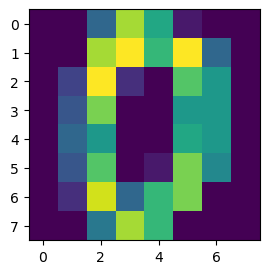

In [2]:
mnist = load_digits()
print(mnist.keys())

#Plot a sample mnist image
image = mnist.images[0]
fig = plt.figure(figsize=(3,3))
plt.imshow(image)
plt.show()

In [3]:
#Import MNIST data and perform KMeans
X = mnist.data
print(X.shape, type(X))

(1797, 64) <class 'numpy.ndarray'>


In [4]:
#Perform K-means
kmeans = KMeans(n_clusters=10, random_state=0, n_init=10)
kmeans.fit(X)

KMeans(n_clusters=10, n_init=10, random_state=0)

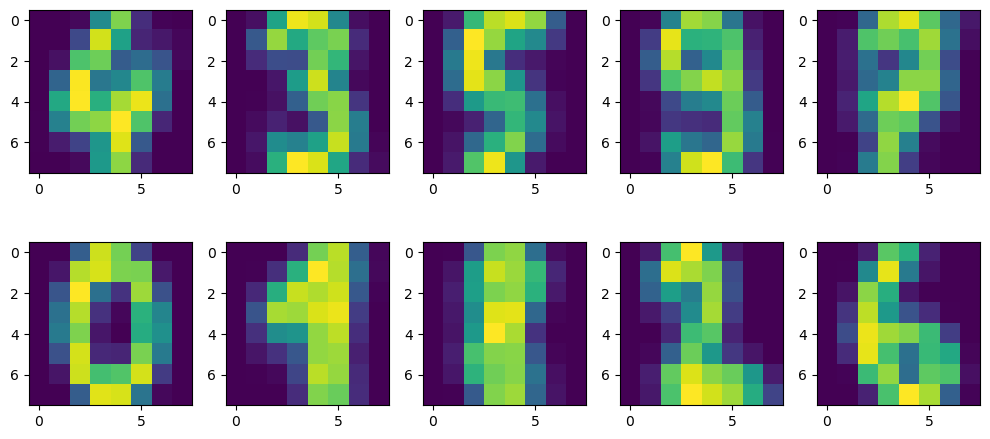

In [5]:
#Reshape each centroid to 8,8 image and plot
clusterCenters = [np.reshape(c, (8,8)) for c in kmeans.cluster_centers_]

#Plot cluster centers
num_row = 2
num_col = 5
# plot images
fig, axes = plt.subplots(num_row, num_col, figsize=(2*num_col,2.5*num_row))
for i in range(len(clusterCenters)):
    ax = axes[i//num_col, i%num_col]
    ax.imshow(clusterCenters[i])
plt.tight_layout()
plt.show()

### DBScan Clustering Algorithm
We will run code to see how the density based clustering algorithm works.

In [6]:
from PIL import Image as im
import sklearn.datasets as datasets

TEMPFILE = 'temp.png'

class DBC():

    def __init__(self, dataset, min_pts, epsilon):
        self.dataset = dataset
        self.min_pts = min_pts 
        self.epsilon = epsilon
        self.snaps = []
        self.assignments = [0 for _ in range(len(self.dataset))]


    def snapshot(self, pt_index):
        fig, ax = plt.subplots()
        colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
        colors = np.hstack([colors] * 30)

        ax.scatter(self.dataset[:, 0], self.dataset[:, 1], color=colors[self.assignments].tolist(), s=10, alpha=0.8)

        circle_coordinates = self.dataset[pt_index]
        cir = plt.Circle(circle_coordinates, radius=0.2, fill=False, color='black') # create circle around the point assigned

        ax.add_patch(cir)
        ax.set_xlim(-2,2)
        ax.set_ylim(-0.2,1.5)
        ax.set_aspect('equal') # necessary or else the circles appear to be oval shaped

        fig.savefig(TEMPFILE)
        plt.close()

        self.snaps.append(im.fromarray(np.asarray(im.open(TEMPFILE))))
        return 


    def get_unlabeled_neighbors(self, i):
        """
        Get only the unlabeled neighbors of point i, that aren't i itself
        """
        neighbors = []
        
        for j in range(len(self.dataset)):
            if i != j and \
            (np.linalg.norm(self.dataset[i] - self.dataset[j]) <= self.epsilon) and (self.assignments[j]==0):
                neighbors.append(j)
                
        return neighbors
        
    
    def is_core(self, i):
        """
        Check if the i^th point is a core point - exclude point itself
        """
        neighbors = []
        #Get all neighbors
        for j in range(len(self.dataset)):
            if i != j and (np.linalg.norm(self.dataset[i] - self.dataset[j]) <= self.epsilon):
                neighbors.append(j)
            
        return len(neighbors) >= self.min_pts
    
    
    def dfs_assignment(self, i, cluster_num):
        """
        Assign the points to clusters after doing dfs
        """
        #self.assignments[i] = cluster_num
        
        neighbors = self.get_unlabeled_neighbors(i) #should return a list of indexes
        
        while neighbors:
            next_candidate = neighbors.pop()
            if self.assignments[next_candidate] != 0:
                print("This shouldn't happen, Help!")
                continue
            
            self.assignments[next_candidate] = cluster_num
            self.snapshot(next_candidate)
            
            if self.is_core(next_candidate):
                #Add only neighbors that aren't already there
                new_neighbors = self.get_unlabeled_neighbors(next_candidate)
                for indx in new_neighbors:
                    if indx not in neighbors:
                        neighbors.append(indx)
        
        return
    
    
    def dbscan(self):
        """
        returns a list of assignments. The index of the
        assignment should match the index of the data point
        in the dataset.
        """
        cluster_num = 1
        
        for i, p in enumerate(self.dataset):
            #print(i)
            if self.assignments[i] != 0:
                #already assigned to a cluster
                continue
            
            if self.is_core(i):
                self.dfs_assignment(i, cluster_num)
            
            else: #label noise points with a separate number/color - we use black
                self.assignments[i] = 6
                
            #Move to next cluster
            cluster_num += 1
        
        return self.assignments



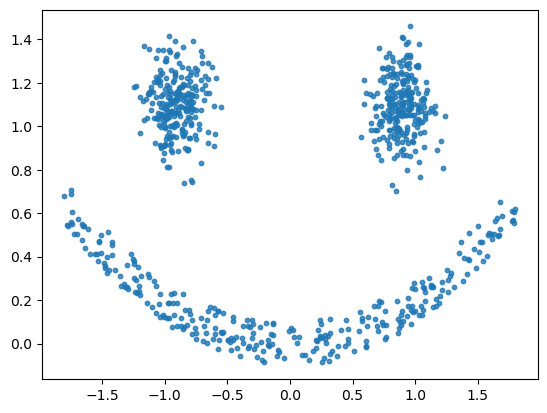

In [7]:
#Create for face blob
centers = [[-0.9,1.1], [0.9,1.1]]
eyes, _ = datasets.make_blobs(n_samples=500, centers=centers, cluster_std=0.13,
                            random_state=0)

mouth_x = np.random.uniform(-1.8,1.8,300)
mouth_y = 0.2*mouth_x**2 + (np.random.uniform(-0.1,0.1, 300))

face = np.append(eyes, list(zip(mouth_x, mouth_y)), axis=0)

#See face plot
plt.scatter(face[:,0],face[:,1],s=10, alpha=0.8)

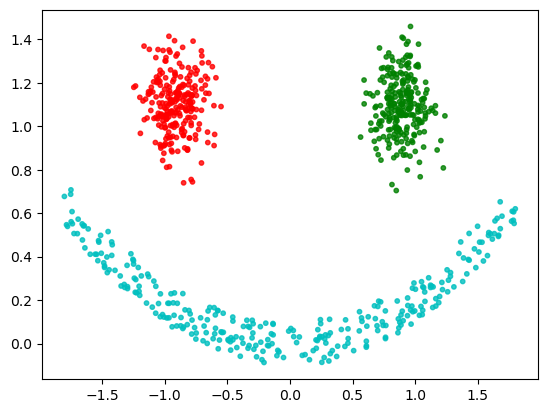

In [8]:
#Run and plot results on for smiley
DBScanClustering_2 = DBC(face, 3, .2)
clustering_2 = DBScanClustering_2.dbscan()

colors = np.array([x for x in 'bgrcmykbgrcmykbgrcmykbgrcmyk'])
colors = np.hstack([colors] * 30)
plt.scatter(face[:, 0], face[:, 1], color=colors[clustering_2].tolist(), s=10, alpha=0.8)
plt.show()


#Save as gif file
DBScanClustering_2.snaps[0].save(
    'dbscan_smile.gif',
    optimize=False,
    save_all=True,
    append_images=DBScanClustering_2.snaps[1:],
    loop=0,
    duration=25
)

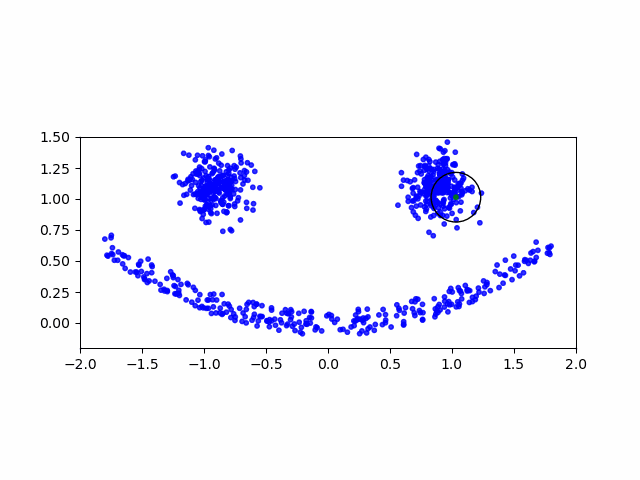

In [9]:
#View the gif
from IPython.display import Image
Image(filename="dbscan_smile.gif", width=500, height=500)